# CNN with Fully Connected Layer

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
exec('from __future__ import  print_function')
from keras.applications import VGG16
from keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator, load_img
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
import keras

Data Pre-processing

In [3]:
image_size = 224
batch_size = 20

In [4]:
train = ImageDataGenerator(rotation_range=30,
                              width_shift_range=0.1,
                              height_shift_range=0.1,
                              rescale=1/255,
                              shear_range=0.2,
                              zoom_range=0.2,
                              horizontal_flip=True,
                              fill_mode= "nearest",
                              )
test = ImageDataGenerator(rotation_range=30,
                              width_shift_range=0.1,
                              height_shift_range=0.1,
                              rescale=1/255,
                              shear_range=0.2,
                              zoom_range=0.2,
                              horizontal_flip=True,
                              fill_mode= "nearest",
                              )

In [5]:
train_dataset = train.flow_from_directory('hafizTraffic1/train/', target_size=(image_size,image_size), batch_size =batch_size, class_mode='categorical', shuffle=True)
validation_dataset = test.flow_from_directory('hafizTraffic1/test/', target_size=(image_size,image_size), batch_size =batch_size, class_mode='categorical', shuffle=False)

Found 2400 images belonging to 3 classes.
Found 600 images belonging to 3 classes.


In [6]:
print(train_dataset.class_indices)
print(train_dataset.classes)
print(validation_dataset.class_indices)
print(validation_dataset.classes)

{'highdensity': 0, 'lowdensity': 1, 'moderatedensity': 2}
[0 0 0 ... 2 2 2]
{'highdensity': 0, 'lowdensity': 1, 'moderatedensity': 2}
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 

In [7]:
nTrain = 2400
nVal = 600

In [8]:
train_features = np.zeros(shape=(nTrain, 7, 7, 512))
train_labels = np.zeros(shape=(nTrain,3))

Data Feature Extraction

In [2]:
vgg_conv = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(224, 224, 3))

vgg_conv.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [9]:

i = 0
for inputs_batch, labels_batch in train_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    train_features[i * batch_size : (i + 1) * batch_size] = features_batch
    train_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= nTrain:
        break
         
# save the features extracted from the training dataset to be passed to model.fit for training        
train_features = np.reshape(train_features, (nTrain, 7 * 7 * 512))

In [10]:
y_train = []
for labels in train_labels:  
    if labels[0] == 1 and labels[1] == 0 and labels[2] == 0:
        y_train.append(0)
    elif labels[0] == 0 and labels[1] == 1 and labels[2] == 0:
        y_train.append(1)
    elif labels[0] == 0 and labels[1] == 0 and labels[2] == 1:
        y_train.append(2)
    else:
        print("something wrong somewhere")

In [11]:
validation_features = np.zeros(shape=(nVal, 7, 7, 512))
validation_labels = np.zeros(shape=(nVal,3))

In [12]:
i = 0
for inputs_batch, labels_batch in validation_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    validation_features[i * batch_size : (i + 1) * batch_size] = features_batch
    validation_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
validation_features = np.reshape(validation_features, (nVal, 7 * 7 * 512))

In [13]:
y_val=[]
for labels in validation_labels:  
    if labels[0] == 1 and labels[1] == 0 and labels[2] == 0:
        y_val.append(0)
    elif labels[0] == 0 and labels[1] == 1 and labels[2] == 0:
        y_val.append(1)
    elif labels[0] == 0 and labels[1] == 0 and labels[2] == 1:
        y_val.append(2)
    else:
        print("something wrong somewhere")

# Fully Connected Layer

In [20]:
from keras import models
from keras import layers
from keras import optimizers
 
model = models.Sequential()
model.add(layers.Dropout(0.7))
model.add(layers.Dense(3, activation='softmax'))

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [21]:
history = model.fit(train_features,
                    train_labels,
                    epochs=10,
                    batch_size=batch_size,
                    validation_data=(validation_features,validation_labels))

Epoch 1/10
120/120 [==============================] - 5s 38ms/step - loss: 1.0937 - accuracy: 0.5925 - val_loss: 0.5715 - val_accuracy: 0.7283
Epoch 2/10
120/120 [==============================] - 4s 33ms/step - loss: 0.6798 - accuracy: 0.7225 - val_loss: 0.5546 - val_accuracy: 0.7633
Epoch 3/10
120/120 [==============================] - 4s 35ms/step - loss: 0.6002 - accuracy: 0.7696 - val_loss: 0.6557 - val_accuracy: 0.7300
Epoch 4/10
120/120 [==============================] - 4s 33ms/step - loss: 0.5265 - accuracy: 0.8000 - val_loss: 0.7182 - val_accuracy: 0.7283: 0.5265 - accuracy: 0.80
Epoch 5/10
120/120 [==============================] - 4s 32ms/step - loss: 0.5106 - accuracy: 0.8125 - val_loss: 0.7619 - val_accuracy: 0.7117
Epoch 6/10
120/120 [==============================] - 4s 35ms/step - loss: 0.4898 - accuracy: 0.8254 - val_loss: 0.5817 - val_accuracy: 0.7867
Epoch 7/10
120/120 [==============================] - 4s 33ms/step - loss: 0.4434 - accuracy: 0.8392 - val_loss: 0.68

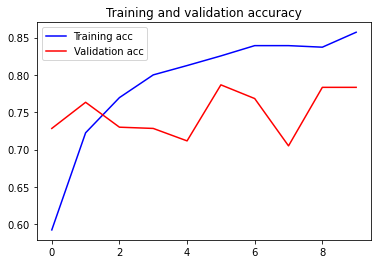

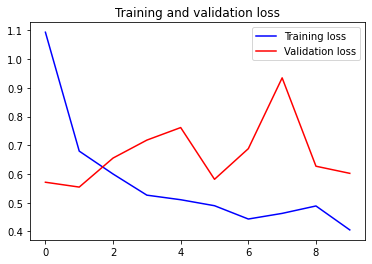

In [22]:
# Plot the accuracy and loss curves
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Overall Accuracy

In [17]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy
from sklearn.metrics import mean_absolute_error

In [ ]:
arr = numpy.array(y_val)

In [24]:
validation_dataset = test.flow_from_directory('hafizTraffic1/test', target_size=(image_size,image_size), batch_size =batch_size, class_mode='categorical')

Found 600 images belonging to 3 classes.


In [25]:
validation_features = np.zeros(shape=(600, 7, 7, 512))
validation_labels = np.zeros(shape=(600,3))

In [26]:
i = 0
for inputs_batch, labels_batch in validation_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    validation_features[i * batch_size : (i + 1) * batch_size] = features_batch
    validation_labels[i * batch_size : (i + 1) * batch_size] = labels_batch
    i += 1
    if i * batch_size >= 600:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
validation_features = np.reshape(validation_features, (600, 7 * 7 * 512))

In [27]:
score = model.evaluate(validation_features, validation_labels)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

19/19 [==============================] - 0s 7ms/step - loss: 0.6076 - accuracy: 0.7767
Test loss: 0.6076249480247498 / Test accuracy: 0.7766666412353516


# Test Accuracy By category

Low-Traffic class validation

In [28]:
#change dir based on category
test_dataset = test.flow_from_directory('hafizTraffic1/test_low', target_size=(image_size,image_size), batch_size =batch_size, class_mode='categorical', shuffle=False)

Found 200 images belonging to 1 classes.


In [29]:
nVal = 200

In [30]:
test_features = np.zeros(shape=(nVal, 7, 7, 512))
test_labels = np.zeros(shape=(nVal,3))

In [31]:
#if high, test label=[1,0,0] = 0
#if low, test label=[0,1,0] = 1
#if mod, test label=[0,0,1] = 2
i = 0
for inputs_batch, labels_batch in test_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    test_features[i * batch_size : (i + 1) * batch_size] = features_batch
    test_labels[i * batch_size : (i + 1) * batch_size] = [0,1,0]
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
test_features = np.reshape(test_features, (nVal, 7 * 7 * 512))

In [32]:
score = model.evaluate(test_features, test_labels)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

7/7 [==============================] - 0s 7ms/step - loss: 0.5503 - accuracy: 0.7900
Test loss: 0.5503203272819519 / Test accuracy: 0.7900000214576721


In [33]:
#if high, test label=[1,0,0] = 0
#if low, test label=[0,1,0] = 1
#if mod, test label=[0,0,1] = 2

fnames = test_dataset.filenames

# Get the ground truth from generator
ground_truth = 1

# Get the label to class mapping from the generator
label2index = validation_dataset.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

In [34]:
# Get the predictions from the model using the generator
predictions = model.predict_classes(test_features)
prob = model.predict(test_features)

In [ ]:
# Show the errors
errors = np.where(predictions != ground_truth)[0]

Wrong Prediction for Low Density Traffic Class

Original label:lowdensity\img (506).PNG, Prediction :moderatedensity, confidence : 0.902


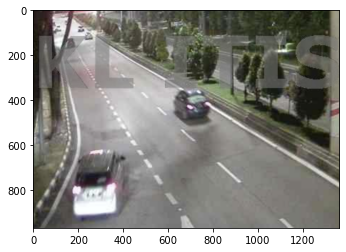

Original label:lowdensity\img (509).PNG, Prediction :moderatedensity, confidence : 0.932


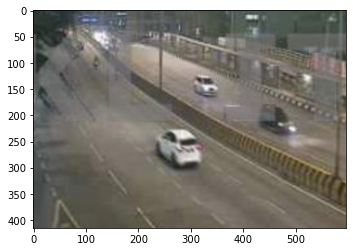

Original label:lowdensity\img (511).PNG, Prediction :moderatedensity, confidence : 0.912


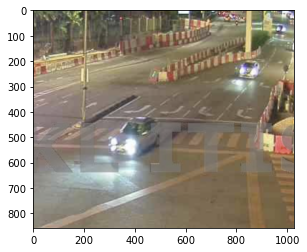

Original label:lowdensity\img (531).PNG, Prediction :moderatedensity, confidence : 0.669


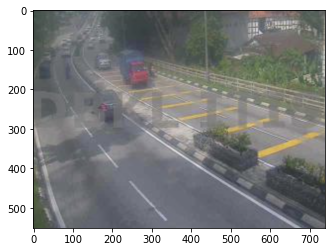

Original label:lowdensity\img (534).PNG, Prediction :moderatedensity, confidence : 0.995


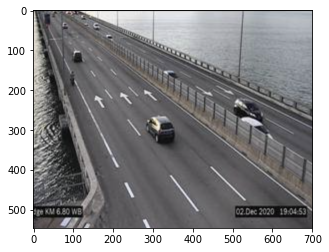

Original label:lowdensity\img (535).PNG, Prediction :moderatedensity, confidence : 0.826


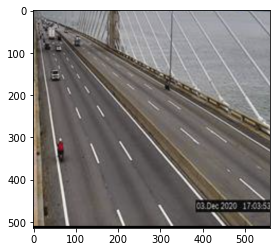

Original label:lowdensity\img (537).PNG, Prediction :moderatedensity, confidence : 0.905


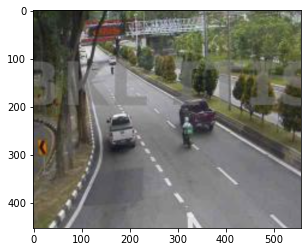

Original label:lowdensity\img (539).PNG, Prediction :moderatedensity, confidence : 0.819


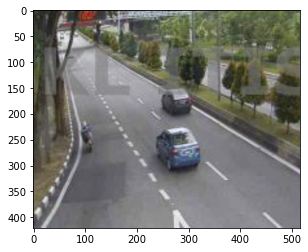

Original label:lowdensity\img (551).PNG, Prediction :moderatedensity, confidence : 0.601


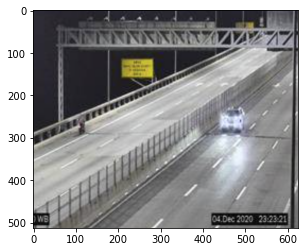

Original label:lowdensity\img (574).PNG, Prediction :moderatedensity, confidence : 0.730


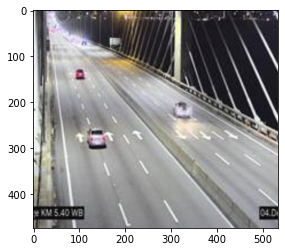

Original label:lowdensity\img (592).PNG, Prediction :moderatedensity, confidence : 0.980


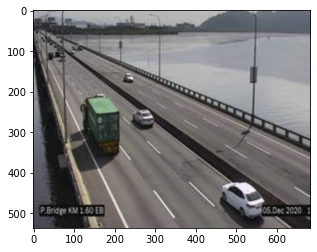

Original label:lowdensity\img (595).PNG, Prediction :moderatedensity, confidence : 0.937


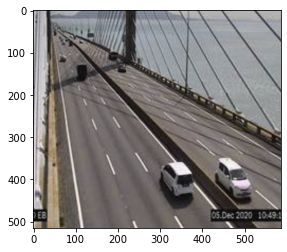

Original label:lowdensity\img (597).PNG, Prediction :moderatedensity, confidence : 0.548


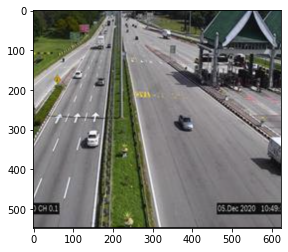

Original label:lowdensity\img (598).PNG, Prediction :moderatedensity, confidence : 0.675


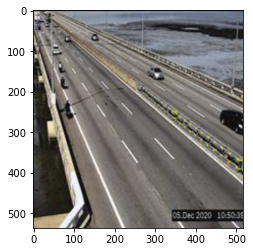

Original label:lowdensity\img (635).PNG, Prediction :moderatedensity, confidence : 0.973


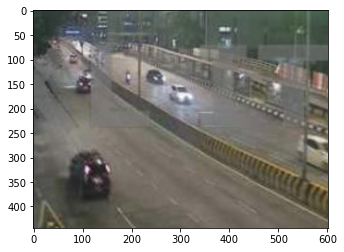

Original label:lowdensity\img (648).PNG, Prediction :moderatedensity, confidence : 0.582


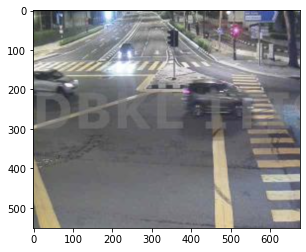

Original label:lowdensity\img (658).PNG, Prediction :moderatedensity, confidence : 0.837


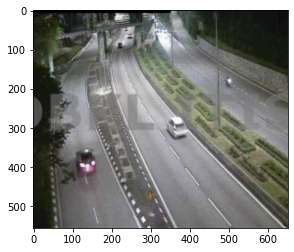

Original label:lowdensity\img (662).PNG, Prediction :moderatedensity, confidence : 0.994


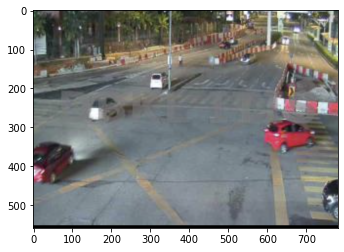

Original label:lowdensity\img (731).PNG, Prediction :moderatedensity, confidence : 0.637


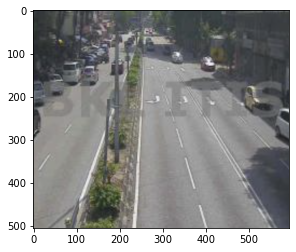

Original label:lowdensity\img (733).PNG, Prediction :moderatedensity, confidence : 0.816


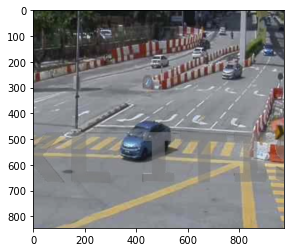

Original label:lowdensity\img (734).PNG, Prediction :moderatedensity, confidence : 0.652


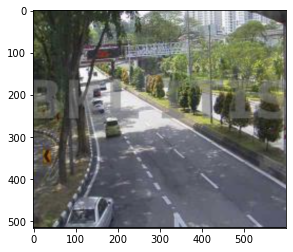

Original label:lowdensity\img (736).PNG, Prediction :moderatedensity, confidence : 0.705


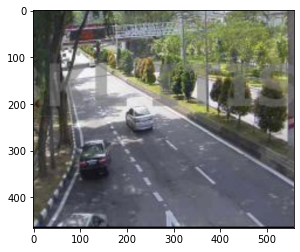

Original label:lowdensity\img (741).PNG, Prediction :moderatedensity, confidence : 0.551


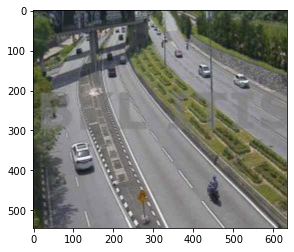

Original label:lowdensity\img (748).PNG, Prediction :moderatedensity, confidence : 0.696


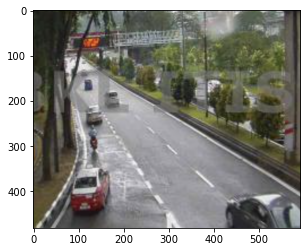

Original label:lowdensity\img (749).PNG, Prediction :moderatedensity, confidence : 0.842


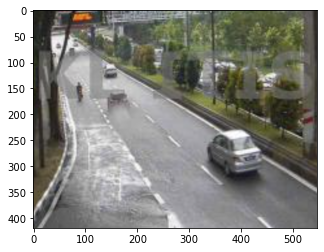

Original label:lowdensity\img (753).PNG, Prediction :moderatedensity, confidence : 0.984


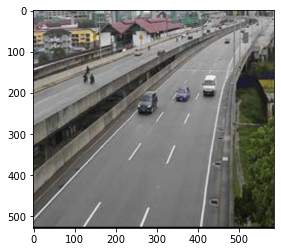

Original label:lowdensity\img (756).PNG, Prediction :moderatedensity, confidence : 0.989


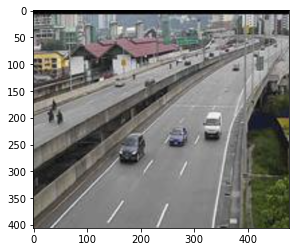

Original label:lowdensity\img (784).PNG, Prediction :moderatedensity, confidence : 0.863


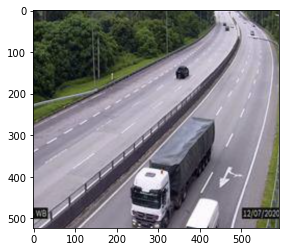

Original label:lowdensity\img (786).PNG, Prediction :moderatedensity, confidence : 0.753


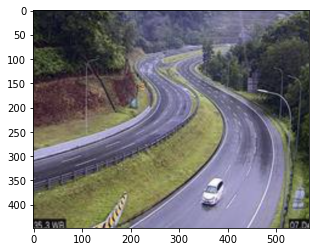

Original label:lowdensity\img (810).PNG, Prediction :moderatedensity, confidence : 0.925


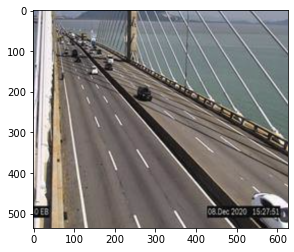

Original label:lowdensity\img (816).PNG, Prediction :highdensity, confidence : 0.457


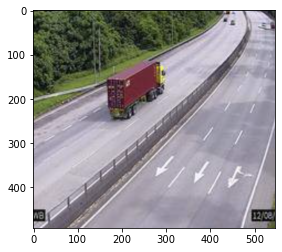

Original label:lowdensity\img (817).PNG, Prediction :moderatedensity, confidence : 0.584


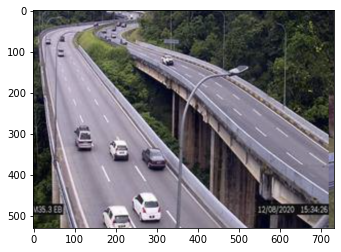

Original label:lowdensity\img (823).PNG, Prediction :moderatedensity, confidence : 0.587


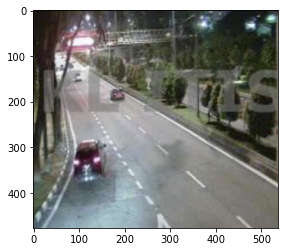

Original label:lowdensity\img (908).PNG, Prediction :moderatedensity, confidence : 0.737


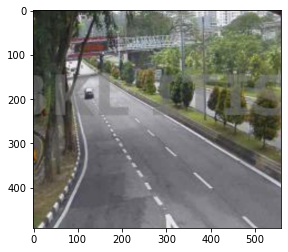

Original label:lowdensity\img (909).PNG, Prediction :moderatedensity, confidence : 0.830


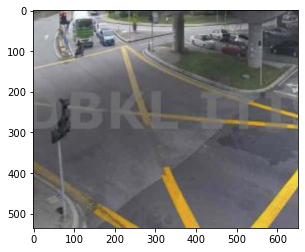

Original label:lowdensity\img (911).PNG, Prediction :moderatedensity, confidence : 0.783


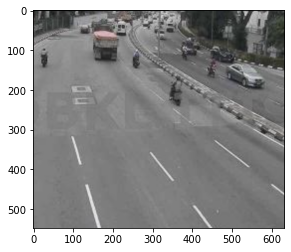

Original label:lowdensity\img (915).PNG, Prediction :moderatedensity, confidence : 0.852


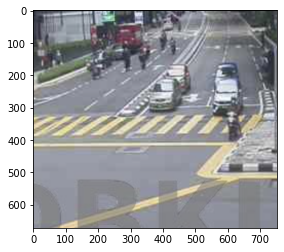

Original label:lowdensity\img (917).PNG, Prediction :moderatedensity, confidence : 0.732


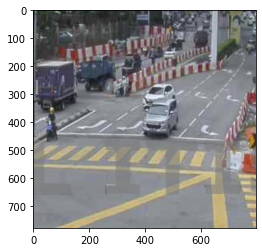

Original label:lowdensity\img (920).PNG, Prediction :moderatedensity, confidence : 0.938


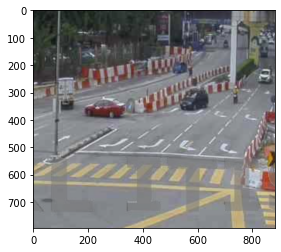

Original label:lowdensity\img (923).PNG, Prediction :moderatedensity, confidence : 0.528


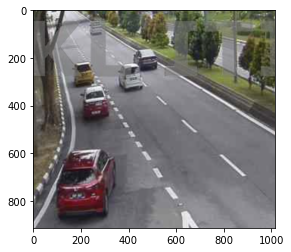

Original label:lowdensity\img (928).PNG, Prediction :moderatedensity, confidence : 0.748


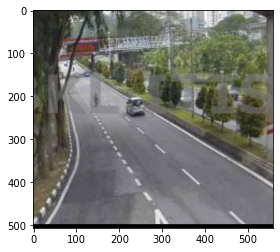

Original label:lowdensity\img (930).PNG, Prediction :moderatedensity, confidence : 0.818


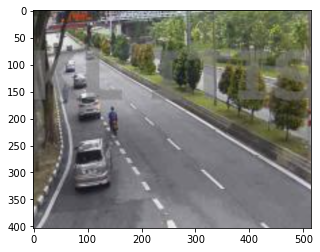

In [36]:
#change dir based on category
# Find the images that were predicted wrongly and who the images along with the predicted class

for i in range(len(errors)):
    pred_class = np.argmax(prob[errors[i]])
    pred_label = idx2label[pred_class]
    
    print('Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        prob[errors[i]][pred_class]))
    
    original = image.load_img('{}/{}'.format('hafizTraffic1/test_low',fnames[errors[i]]))
    plt.imshow(original)
    plt.show()

# High Traffic Category

In [37]:
#change dir based on category
test_dataset = test.flow_from_directory('hafizTraffic1/test_high', target_size=(image_size,image_size), batch_size =batch_size, class_mode='categorical', shuffle=False)

Found 200 images belonging to 1 classes.


In [38]:
nVal = 200

In [39]:
test_features = np.zeros(shape=(nVal, 7, 7, 512))
test_labels = np.zeros(shape=(nVal,3))

In [40]:
#if high, test label=[1,0,0] = 0
#if low, test label=[0,1,0] = 1
#if mod, test label=[0,0,1] = 2
i = 0
for inputs_batch, labels_batch in test_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    test_features[i * batch_size : (i + 1) * batch_size] = features_batch
    test_labels[i * batch_size : (i + 1) * batch_size] = [1,0,0]
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
test_features = np.reshape(test_features, (nVal, 7 * 7 * 512))

In [41]:
score = model.evaluate(test_features, test_labels)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

7/7 [==============================] - 0s 10ms/step - loss: 0.3033 - accuracy: 0.8800
Test loss: 0.303300142288208 / Test accuracy: 0.8799999952316284


In [42]:
#if high, test label=[1,0,0] = 0
#if low, test label=[0,1,0] = 1
#if mod, test label=[0,0,1] = 2

fnames = test_dataset.filenames

# Get the ground truth from generator
ground_truth = 0

# Get the label to class mapping from the generator
label2index = validation_dataset.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

In [43]:
# Get the predictions from the model using the generator
predictions = model.predict_classes(test_features)
prob = model.predict(test_features)

In [ ]:
# Show the errors
errors = np.where(predictions != ground_truth)[0]

Wrong Prediction for High Density Traffic Class

Original label:highdensity\img (628).PNG, Prediction :moderatedensity, confidence : 0.565


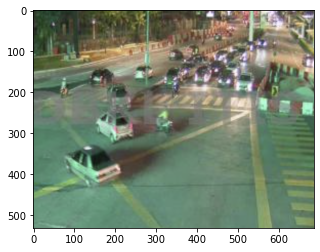

Original label:highdensity\img (631).PNG, Prediction :moderatedensity, confidence : 0.615


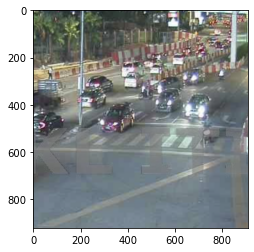

Original label:highdensity\img (637).PNG, Prediction :lowdensity, confidence : 0.882


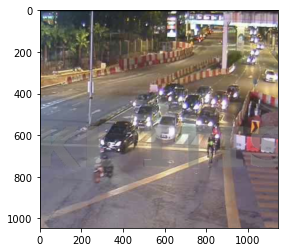

Original label:highdensity\img (642).PNG, Prediction :moderatedensity, confidence : 0.852


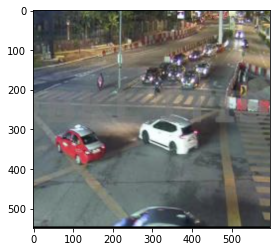

Original label:highdensity\img (654).PNG, Prediction :moderatedensity, confidence : 0.996


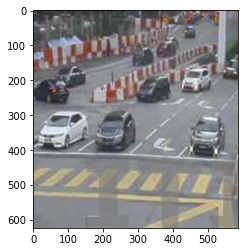

Original label:highdensity\img (667).PNG, Prediction :moderatedensity, confidence : 0.511


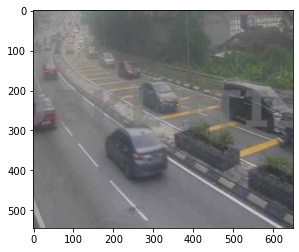

Original label:highdensity\img (681).PNG, Prediction :moderatedensity, confidence : 0.983


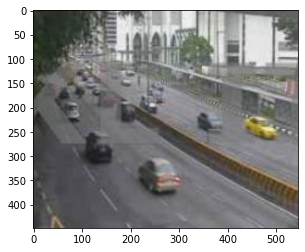

Original label:highdensity\img (695).PNG, Prediction :moderatedensity, confidence : 0.516


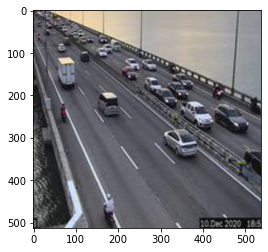

Original label:highdensity\img (696).PNG, Prediction :moderatedensity, confidence : 0.643


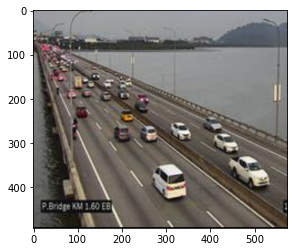

Original label:highdensity\img (697).PNG, Prediction :moderatedensity, confidence : 0.914


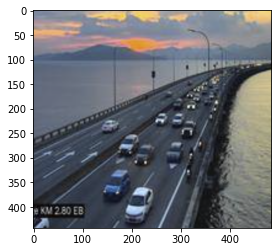

Original label:highdensity\img (764).PNG, Prediction :moderatedensity, confidence : 0.850


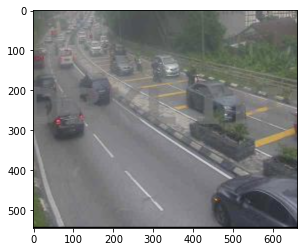

Original label:highdensity\img (767).PNG, Prediction :moderatedensity, confidence : 0.890


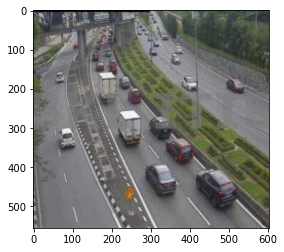

Original label:highdensity\img (773).PNG, Prediction :moderatedensity, confidence : 0.810


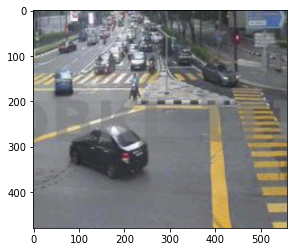

Original label:highdensity\img (782).PNG, Prediction :moderatedensity, confidence : 0.561


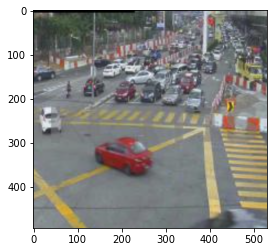

Original label:highdensity\img (788).PNG, Prediction :moderatedensity, confidence : 0.841


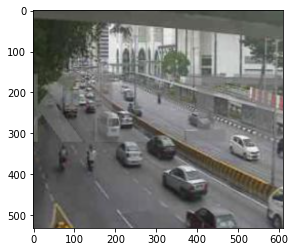

Original label:highdensity\img (789).PNG, Prediction :moderatedensity, confidence : 0.800


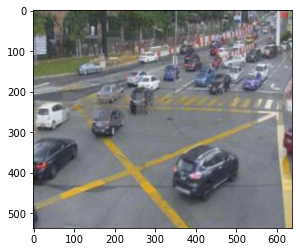

Original label:highdensity\img (795).PNG, Prediction :moderatedensity, confidence : 0.941


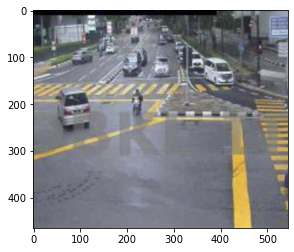

Original label:highdensity\img (803).PNG, Prediction :moderatedensity, confidence : 0.886


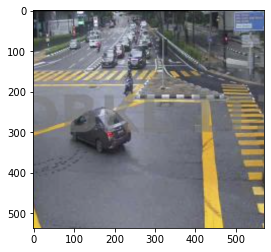

Original label:highdensity\img (810).PNG, Prediction :moderatedensity, confidence : 0.702


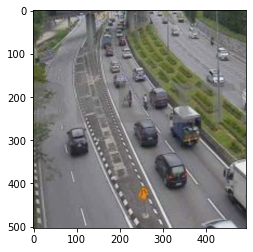

Original label:highdensity\img (812).PNG, Prediction :moderatedensity, confidence : 0.531


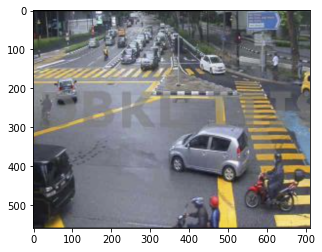

Original label:highdensity\img (867).PNG, Prediction :moderatedensity, confidence : 0.591


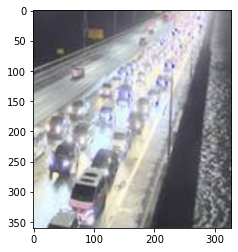

Original label:highdensity\img (880).PNG, Prediction :moderatedensity, confidence : 0.532


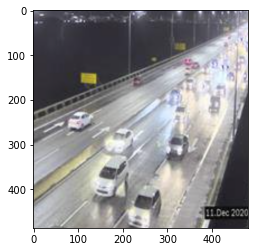

Original label:highdensity\img (892).PNG, Prediction :moderatedensity, confidence : 0.704


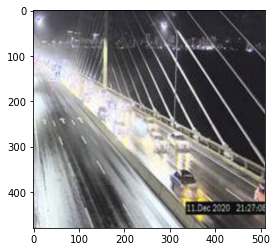

Original label:highdensity\img (958).PNG, Prediction :moderatedensity, confidence : 0.932


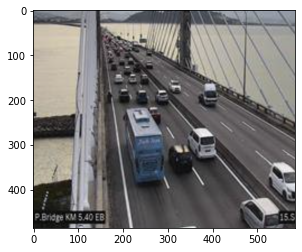

In [45]:
#change dir based on category
# Find the images that were predicted wrongly and who the images along with the predicted class

for i in range(len(errors)):
    pred_class = np.argmax(prob[errors[i]])
    pred_label = idx2label[pred_class]
    
    print('Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        prob[errors[i]][pred_class]))
    
    original = image.load_img('{}/{}'.format('hafizTraffic1/test_high',fnames[errors[i]]))
    plt.imshow(original)
    plt.show()

# Moderate Traffic Category

In [56]:
#change dir based on category
test_dataset = test.flow_from_directory('hafizTraffic1/test_moderate', target_size=(image_size,image_size), batch_size =batch_size, class_mode='categorical', shuffle=False)

Found 200 images belonging to 1 classes.


In [57]:
nVal = 200

In [58]:
test_features = np.zeros(shape=(nVal, 7, 7, 512))
test_labels = np.zeros(shape=(nVal,3))

In [59]:
#if high, test label=[1,0,0] = 0
#if low, test label=[0,1,0] = 1
#if mod, test label=[0,0,1] = 2
i = 0
for inputs_batch, labels_batch in test_dataset:
    features_batch = vgg_conv.predict(inputs_batch)
    test_features[i * batch_size : (i + 1) * batch_size] = features_batch
    test_labels[i * batch_size : (i + 1) * batch_size] = [0,0,1]
    i += 1
    if i * batch_size >= nVal:
        break

# save the features extracted from the validation dataset to be passed to model.fit for training 
test_features = np.reshape(test_features, (nVal, 7 * 7 * 512))

In [60]:
score = model.evaluate(test_features, test_labels)
print(f'Test loss: {score[0]} / Test accuracy: {score[1]}')

7/7 [==============================] - 0s 6ms/step - loss: 0.8219 - accuracy: 0.6900
Test loss: 0.8219031691551208 / Test accuracy: 0.6899999976158142


In [61]:
#if high, test label=[1,0,0] = 0
#if low, test label=[0,1,0] = 1
#if mod, test label=[0,0,1] = 2

fnames = test_dataset.filenames

# Get the ground truth from generator
ground_truth = 2

# Get the label to class mapping from the generator
label2index = validation_dataset.class_indices
 
# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

In [62]:
# Get the predictions from the model using the generator
predictions = model.predict_classes(test_features)
prob = model.predict(test_features)

In [ ]:
# Show the errors
errors = np.where(predictions != ground_truth)[0]

Wrong Prediction for Moderate Density Traffic Class

Original label:moderatedensity\img (1029).PNG, Prediction :lowdensity, confidence : 0.534


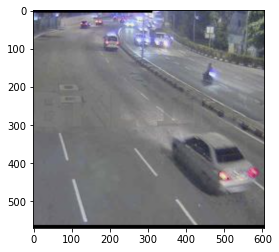

Original label:moderatedensity\img (1033).PNG, Prediction :lowdensity, confidence : 0.942


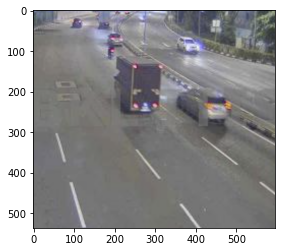

Original label:moderatedensity\img (1038).PNG, Prediction :lowdensity, confidence : 0.820


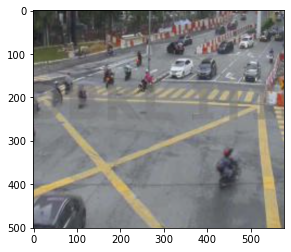

Original label:moderatedensity\img (1045).PNG, Prediction :highdensity, confidence : 0.524


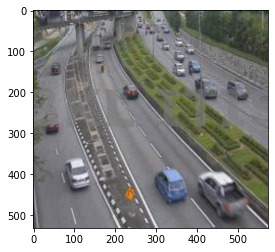

Original label:moderatedensity\img (374).PNG, Prediction :lowdensity, confidence : 0.978


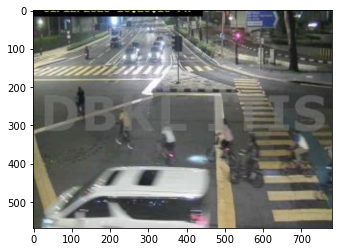

Original label:moderatedensity\img (459).PNG, Prediction :lowdensity, confidence : 0.784


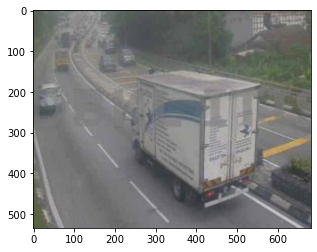

Original label:moderatedensity\img (460).PNG, Prediction :highdensity, confidence : 0.978


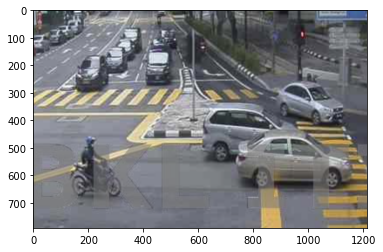

Original label:moderatedensity\img (468).PNG, Prediction :lowdensity, confidence : 0.961


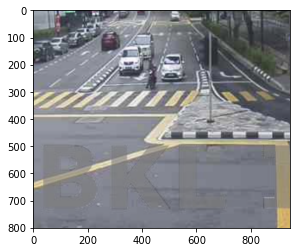

Original label:moderatedensity\img (472).PNG, Prediction :highdensity, confidence : 0.606


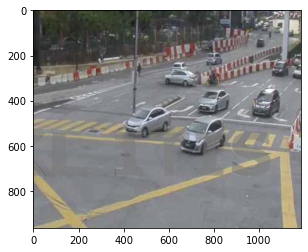

Original label:moderatedensity\img (474).PNG, Prediction :highdensity, confidence : 0.881


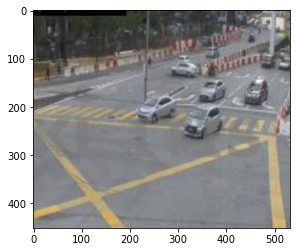

Original label:moderatedensity\img (476).PNG, Prediction :lowdensity, confidence : 0.966


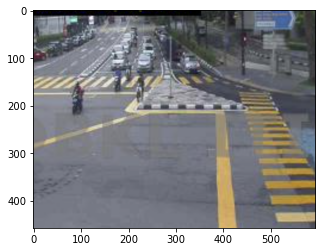

Original label:moderatedensity\img (479).PNG, Prediction :highdensity, confidence : 0.755


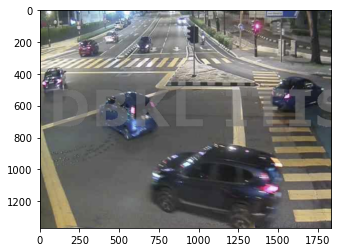

Original label:moderatedensity\img (480).PNG, Prediction :lowdensity, confidence : 0.628


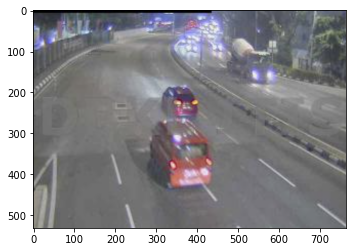

Original label:moderatedensity\img (491).PNG, Prediction :lowdensity, confidence : 0.882


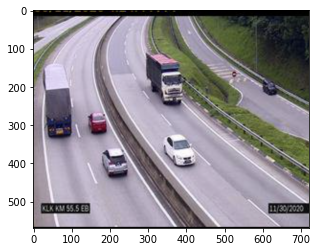

Original label:moderatedensity\img (492).PNG, Prediction :lowdensity, confidence : 0.999


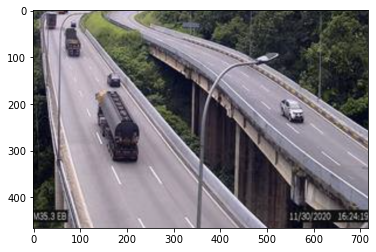

Original label:moderatedensity\img (499).PNG, Prediction :highdensity, confidence : 0.403


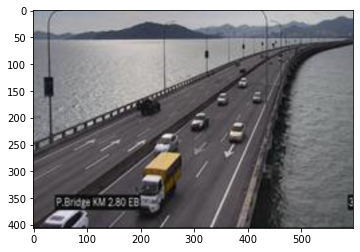

Original label:moderatedensity\img (549).PNG, Prediction :lowdensity, confidence : 0.611


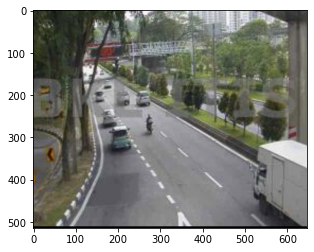

Original label:moderatedensity\img (550).PNG, Prediction :lowdensity, confidence : 0.558


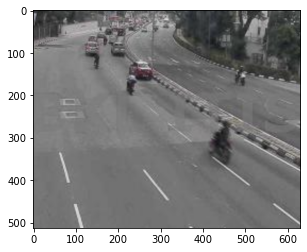

Original label:moderatedensity\img (551).PNG, Prediction :lowdensity, confidence : 0.882


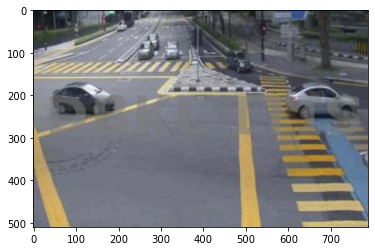

Original label:moderatedensity\img (555).PNG, Prediction :highdensity, confidence : 0.648


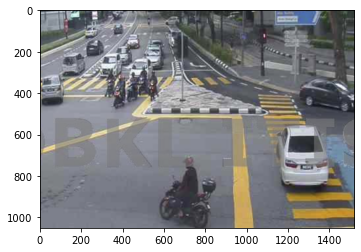

Original label:moderatedensity\img (597).PNG, Prediction :lowdensity, confidence : 0.599


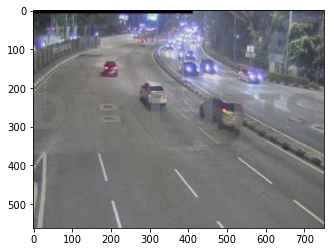

Original label:moderatedensity\img (621).PNG, Prediction :lowdensity, confidence : 0.922


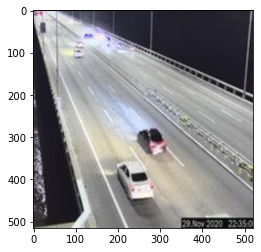

Original label:moderatedensity\img (622).PNG, Prediction :lowdensity, confidence : 0.600


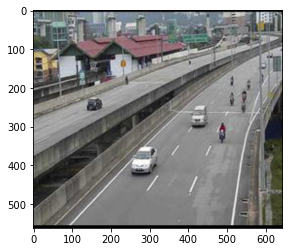

Original label:moderatedensity\img (651).PNG, Prediction :lowdensity, confidence : 0.855


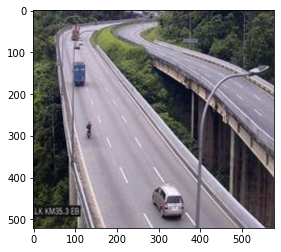

Original label:moderatedensity\img (666).PNG, Prediction :lowdensity, confidence : 0.938


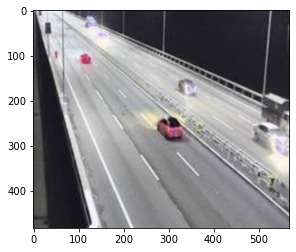

Original label:moderatedensity\img (668).PNG, Prediction :lowdensity, confidence : 0.766


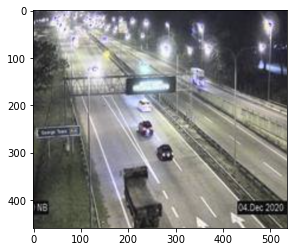

Original label:moderatedensity\img (669).PNG, Prediction :lowdensity, confidence : 0.998


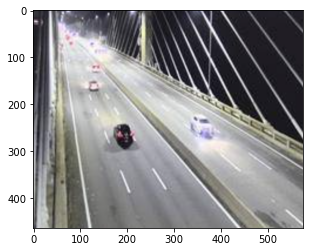

Original label:moderatedensity\img (670).PNG, Prediction :lowdensity, confidence : 0.553


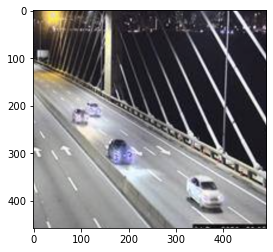

Original label:moderatedensity\img (671).PNG, Prediction :lowdensity, confidence : 0.939


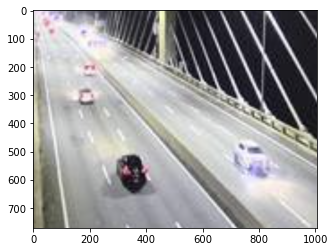

Original label:moderatedensity\img (672).PNG, Prediction :lowdensity, confidence : 0.634


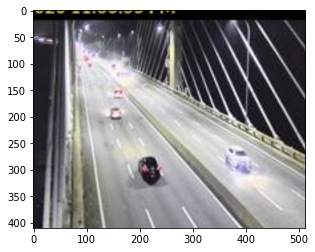

Original label:moderatedensity\img (676).PNG, Prediction :lowdensity, confidence : 0.512


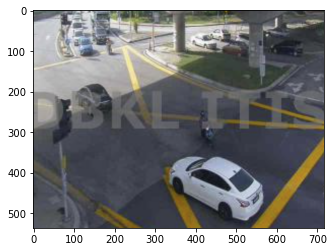

Original label:moderatedensity\img (790).PNG, Prediction :highdensity, confidence : 0.599


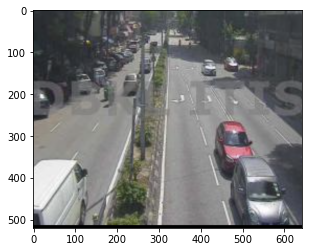

Original label:moderatedensity\img (857).PNG, Prediction :lowdensity, confidence : 0.777


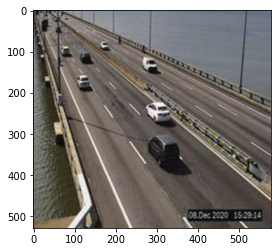

Original label:moderatedensity\img (859).PNG, Prediction :highdensity, confidence : 0.977


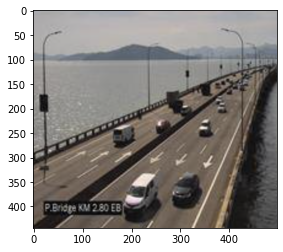

Original label:moderatedensity\img (888).PNG, Prediction :highdensity, confidence : 0.724


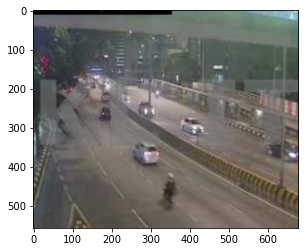

Original label:moderatedensity\img (890).PNG, Prediction :lowdensity, confidence : 0.444


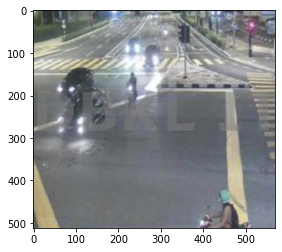

Original label:moderatedensity\img (891).PNG, Prediction :lowdensity, confidence : 0.795


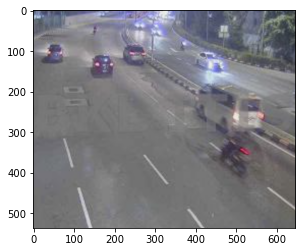

Original label:moderatedensity\img (894).PNG, Prediction :highdensity, confidence : 0.928


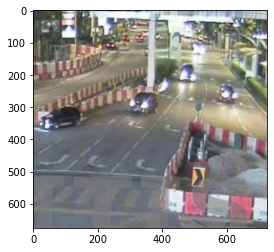

Original label:moderatedensity\img (898).PNG, Prediction :lowdensity, confidence : 0.924


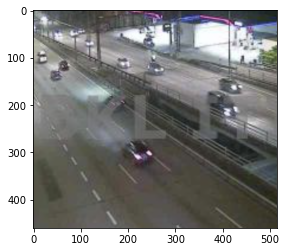

Original label:moderatedensity\img (900).PNG, Prediction :lowdensity, confidence : 0.668


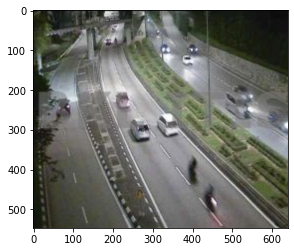

Original label:moderatedensity\img (904).PNG, Prediction :lowdensity, confidence : 0.872


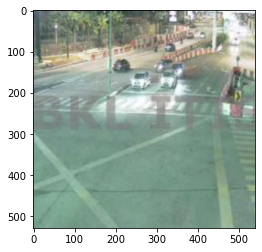

Original label:moderatedensity\img (906).PNG, Prediction :highdensity, confidence : 0.510


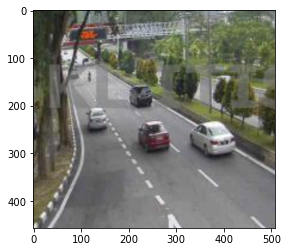

Original label:moderatedensity\img (908).PNG, Prediction :lowdensity, confidence : 0.868


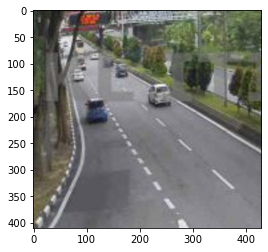

Original label:moderatedensity\img (909).PNG, Prediction :lowdensity, confidence : 0.992


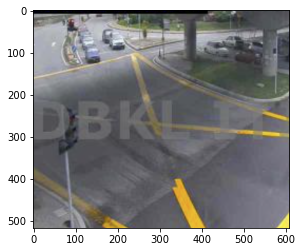

Original label:moderatedensity\img (911).PNG, Prediction :highdensity, confidence : 0.795


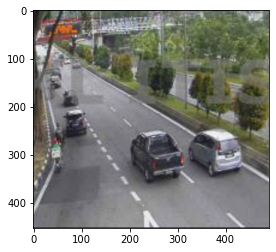

Original label:moderatedensity\img (913).PNG, Prediction :lowdensity, confidence : 0.948


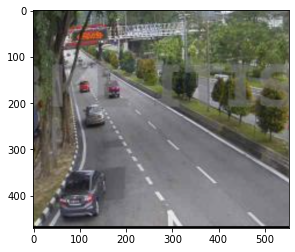

Original label:moderatedensity\img (921).PNG, Prediction :highdensity, confidence : 0.590


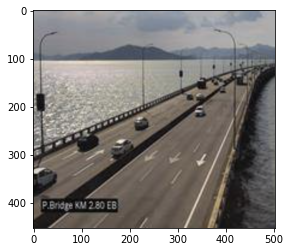

Original label:moderatedensity\img (923).PNG, Prediction :highdensity, confidence : 0.777


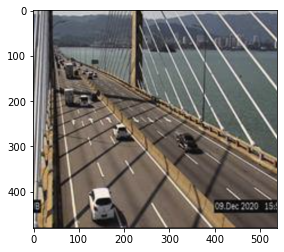

Original label:moderatedensity\img (930).PNG, Prediction :highdensity, confidence : 0.837


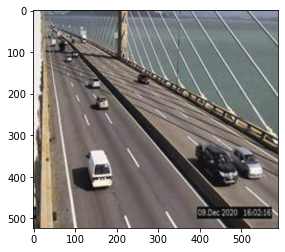

Original label:moderatedensity\img (931).PNG, Prediction :lowdensity, confidence : 0.953


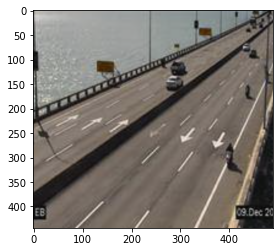

Original label:moderatedensity\img (932).PNG, Prediction :highdensity, confidence : 0.972


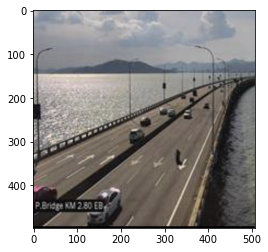

Original label:moderatedensity\img (938).PNG, Prediction :highdensity, confidence : 0.616


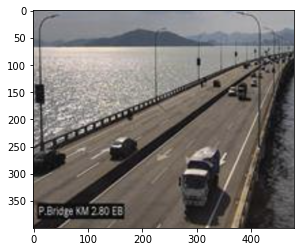

Original label:moderatedensity\img (947).PNG, Prediction :lowdensity, confidence : 0.832


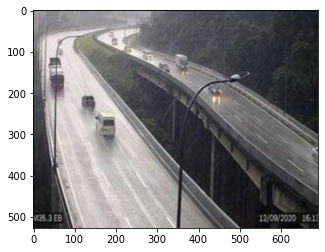

Original label:moderatedensity\img (956).PNG, Prediction :lowdensity, confidence : 0.999


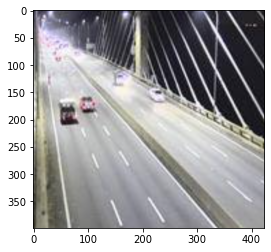

Original label:moderatedensity\img (959).PNG, Prediction :lowdensity, confidence : 0.831


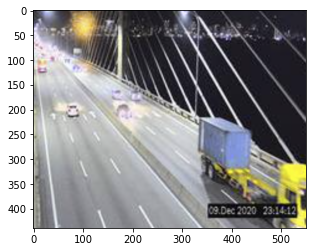

Original label:moderatedensity\img (960).PNG, Prediction :lowdensity, confidence : 0.996


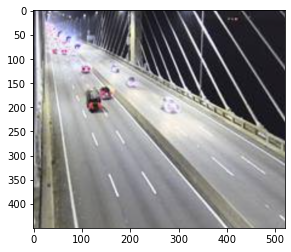

Original label:moderatedensity\img (964).PNG, Prediction :lowdensity, confidence : 0.775


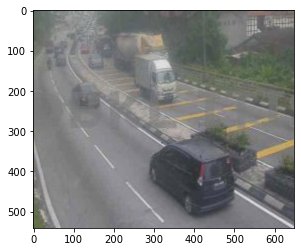

Original label:moderatedensity\img (965).PNG, Prediction :lowdensity, confidence : 0.899


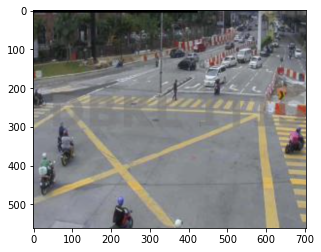

Original label:moderatedensity\img (970).PNG, Prediction :lowdensity, confidence : 0.703


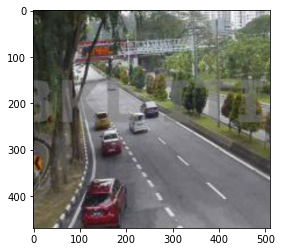

Original label:moderatedensity\img (971).PNG, Prediction :highdensity, confidence : 0.993


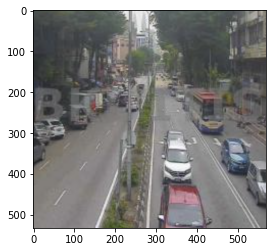

Original label:moderatedensity\img (974).PNG, Prediction :lowdensity, confidence : 0.642


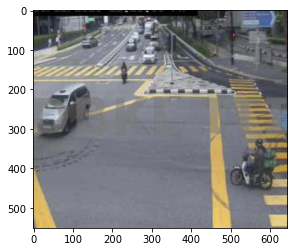

Original label:moderatedensity\img (975).PNG, Prediction :lowdensity, confidence : 0.918


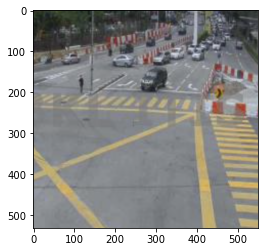

In [64]:
#change dir based on category
# Find the images that were predicted wrongly and who the images along with the predicted class

for i in range(len(errors)):
    pred_class = np.argmax(prob[errors[i]])
    pred_label = idx2label[pred_class]
    
    print('Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        prob[errors[i]][pred_class]))
    
    original = image.load_img('{}/{}'.format('hafizTraffic1/test_moderate',fnames[errors[i]]))
    plt.imshow(original)
    plt.show()

In [23]:
Y_pred = model.predict_classes(validation_features)
print('Confusion Matrix')
print(confusion_matrix(arr, Y_pred))
print('Classification Report')
target_names = ['highdensity', 'lowdensity', 'moderatedensity']
print(classification_report(arr, Y_pred, target_names=target_names))

Confusion Matrix
[[177   2  21]
 [  2 155  43]
 [ 24  38 138]]
Classification Report
                 precision    recall  f1-score   support

    highdensity       0.87      0.89      0.88       200
     lowdensity       0.79      0.78      0.78       200
moderatedensity       0.68      0.69      0.69       200

       accuracy                           0.78       600
      macro avg       0.78      0.78      0.78       600
   weighted avg       0.78      0.78      0.78       600



Save Model

In [65]:
import pickle

In [67]:
model.save("Cnn_model.h5")

In [68]:
model.save("Cnn_model.hdf5")